In [1]:
import numpy as np
import cv2 as cv
from scipy . optimize import minimize
from scipy import linalg
import matplotlib . pyplot as plt

In [42]:
import numpy as np
import cv2 as cv
from scipy . optimize import minimize
from scipy import linalg
import matplotlib . pyplot as plt

#np . random . seed ( 0 )
N = 100
half_n = N// 2
r = 10
s = r /16
t = np.random.uniform (0 , 2*np.pi , half_n )
n = s * np.random.randn( half_n )
x , y = (r + n)*np.cos(t) , (r + n)*np.sin(t)
X_circ = np.hstack(( x.reshape(half_n , 1 ) , y.reshape (half_n , 1 )))
m, b = -1, 2
x = np.linspace (-12, 12 , half_n )
y = m*x + b + s*np.random.randn( half_n )
X_line = np.hstack(( x.reshape ( half_n , 1 ) , y.reshape ( half_n , 1 ) ) )
X = np.vstack ( ( X_line ,X_circ  ) )


#plt.figure(figsize=(16,16))
#for point in X:
#    plt.scatter(point[0],point[1])
#    plt.axis("equal")
#plt.show()

RANSAC for a Straight Line

600


C:\Users\Lahiru Shyamal\AppData\Local\Temp\ipykernel_4596\2375726728.py:22: RuntimeWarning: invalid value encountered in double_scalars
  distance = abs((a*X[i][0] + b*X[i][1] + c)/ (np.sqrt(a**2 + b**2)) )


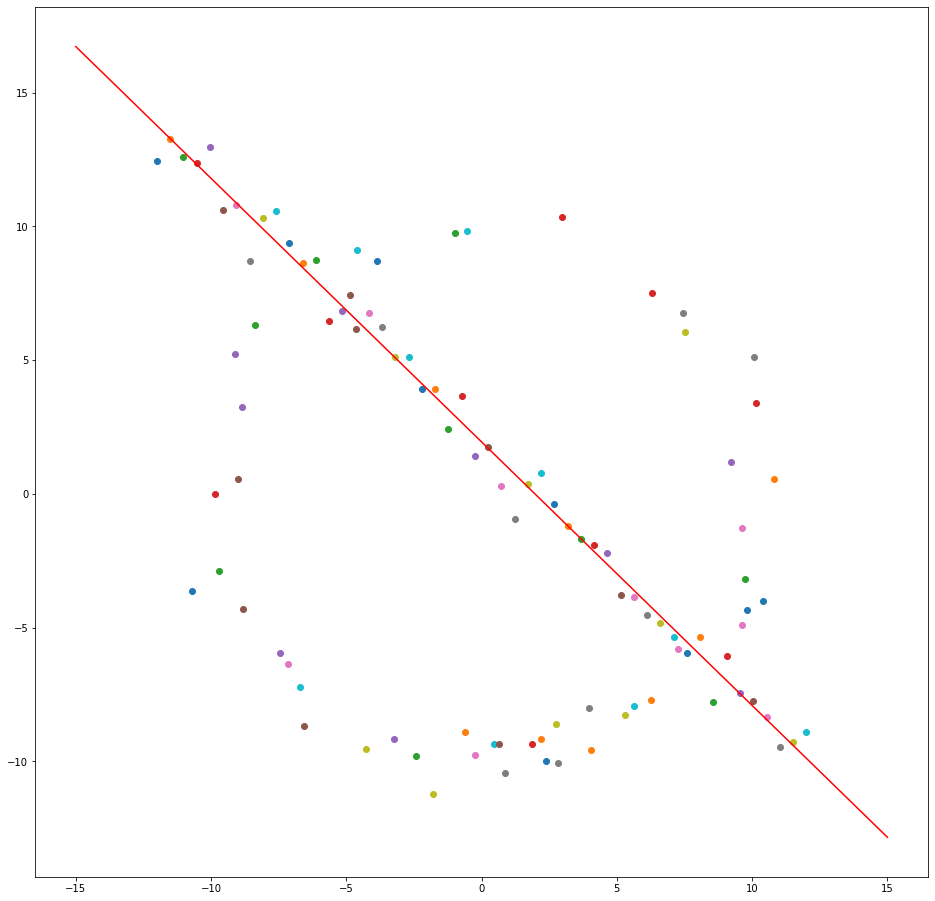

Number of Samples = 600
Inlinear Count = 50


In [50]:
import random

s = 2
t = 1
e = 0.3
p = 0.99
N = int (np.log(1-p) / np.log(1 - (1-e)**s))*100
print(N)
max_inlinear_count = 0
coefficients = []

for sample in range(0 , N+1):
    dot1 , dot2 = random.randint(0,len(X)-1), random.randint(0,len(X)-1)
    # equation of a line passing the 2 points ; (y1-y2).X + (x2-x1).Y + (x1.y2 - y1.x2) = 0 
    a = X[dot1][1] - X[dot2][1]
    b = X[dot2][0] - X[dot1][0]
    c = X[dot1][0]*X[dot2][1]  - X[dot1][1]*X[dot2][0]

    # find the count of the points lying withing the threshold (t)
    inlinears_count = 0
    for  i in range(0 , len(X)):
        distance = abs((a*X[i][0] + b*X[i][1] + c)/ (np.sqrt(a**2 + b**2)) )
        if distance < t:
            inlinears_count += 1

    if inlinears_count > max_inlinear_count:
        max_inlinear_count = inlinears_count
        coefficients = [ a, b, c]

plt.figure(figsize=(16,16))
for point in X:
    plt.scatter(point[0],point[1])

A , B , C = coefficients[0] , coefficients[1] , coefficients[2]
x_values = np.arange(-15,15+1)
y_values = -1*(x_values*A +C)/B

plt.plot(x_values, y_values , color="red")
plt.show()
print("Number of Samples =",N)
print("Inlinear Count =",max_inlinear_count)

## RANSAC for a Circle

Function to generate a circle from three points

In [59]:
import random
def Circle_from3points(All_points ,Number_of_itaration ,tresh):  # function to generate a circle from 3 points
             
    max_inlinear_count = 0
    for sample in range(0 , Number_of_itaration+1):
        dot1 , dot2 , dot3 = random.randint(0,len(All_points)-1), random.randint(0,len(All_points)-1) , random.randint(0,len(All_points)-1)
        x1,x2,x3 = All_points[dot1][0] , All_points[dot2][0] , All_points[dot3][0]
        y1,y2,y3 = All_points[dot1][1] , All_points[dot2][1] , All_points[dot3][1]

        P = np.array([[2*x1 , 2*y1 , 1] , [2*x2 , 2*y2 , 1] , [2*x3 , 2*y3 , 1]])  # define the matrix from known 3 points
        if (np.linalg.det(P)==0): continue                                         # check whether the selected points are colinear
        K = np.array([[x1**2 +y1**2] , [x2**2 +y2**2] , [x3**2 +y3**2]])*(-1)      
        answ = np.linalg.inv(P) @ K                                                # solve the above leaner equations
        g , f , c = answ[0][0] , answ[1][0] , answ[2][0]                           # to find the coefficient of the circle
        radius = np.sqrt(g**2 + f**2 -c)
        if (radius>10): continue
        center = [-g , -f]
                                        # Ransac estimation for any given number of iterations. 
        inlinears_count = 0
        for  i in range(0 , len(All_points)):
            distance = abs(np.sqrt((All_points[i][0]-center[0])**2 + (All_points[i][1]-center[1])**2) - radius) 
                                                                    # find the distance to the point from the circumference of the circle
            if distance < tresh:                                    # compare with a given threshold  
                inlinears_count += 1
        if inlinears_count > max_inlinear_count:
            max_inlinear_count = inlinears_count
            coefficients =  [f, g, c]
            best_Sample_points = np.array([All_points[dot1],All_points[dot2],All_points[dot3]])
    return(coefficients,best_Sample_points,max_inlinear_count)      

        


RANSAC Estiomation of a cicle

In [68]:
s = 3
t = 1
e = 0.3
p = 0.99
N = int( (np.log(1-p) / np.log(1 - (1-e)**s)) + 0.5 )  # adding 0.5 to get the ceil value

ran_coeff , ransac_sample , ransac_inlinear_count = Circle_from3points(X,N*100,t)
F, G ,C = ran_coeff[0] , ran_coeff[1] , ran_coeff[2]
R = np.sqrt(G**2 + F**2 -C)

# Finding Inlenears and Outlinears of the RANSAC Estimated Circle
IN_liers,Out = [] ,[]
for point in X:
    d = abs(np.sqrt((point[0]+G)**2 + (point[1]+F)**2) - R)
    if d < t:
        IN_liers.append(point)
    else:
        Out.append(point)

Inlin = np.array(IN_liers).T
Outlin = np.array(Out).T
Samp = ransac_sample.T

print("Number of Itarations =",N)
print("RANSAC Estimated circle Inlinear Count =",ransac_inlinear_count)



Number of Itarations = 11
RANSAC Estimated circle Inlinear Count = 49


Finding the best fitting circle

In [97]:

best_fitting_coeff , best_selected_pionts , best_inlinear_count = Circle_from3points(IN_liers,N,t)
best_F, best_G ,best_C = best_fitting_coeff[0] , best_fitting_coeff[1] , best_fitting_coeff[2]
best_R = np.sqrt(best_G**2 + best_F**2 -best_C)

b_samp = best_selected_pionts.T

print("best fitting circle Inlinear Count =",best_inlinear_count)

best fitting circle Inlinear Count = 46


Plotting the above Results

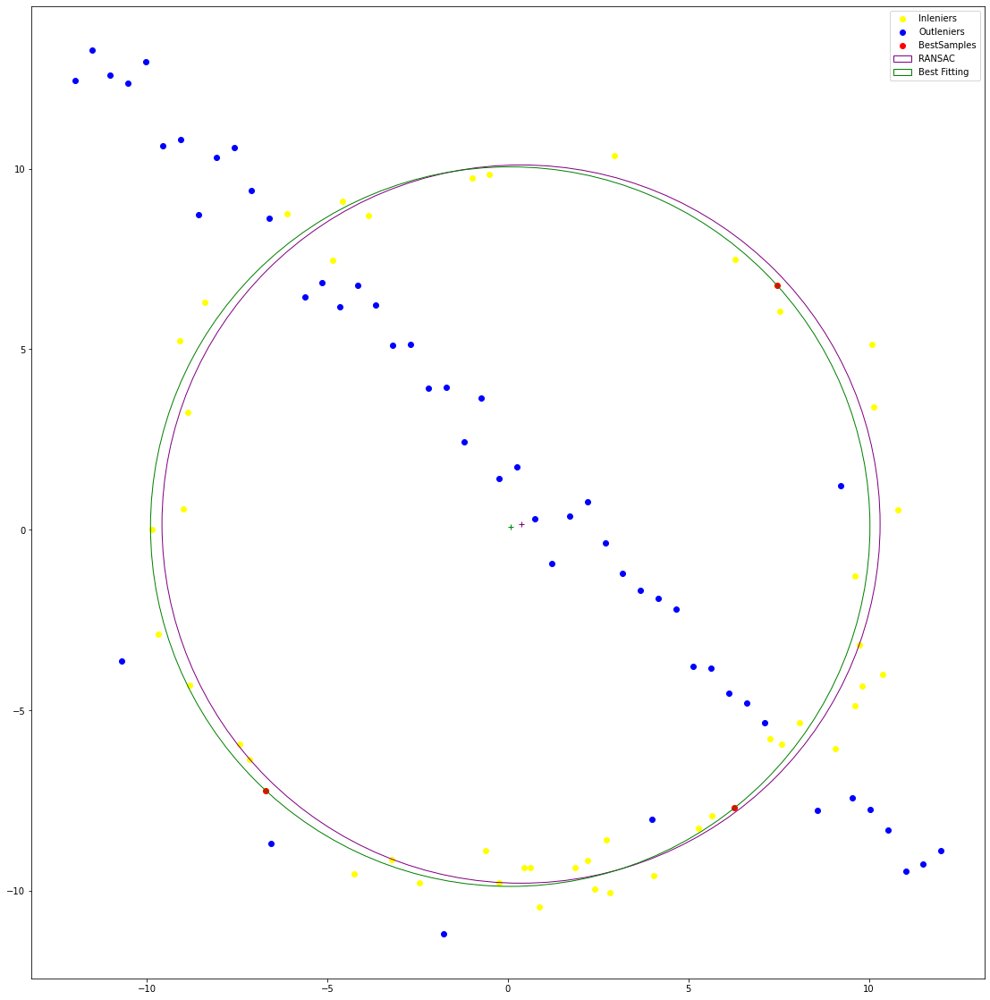

In [98]:
#plotting
figure, axes = plt.subplots( 1, figsize=(20,20) )

ransac_circle = plt.Circle((-G,-F), R, fill=False, color="purple" ,label="RANSAC")
best_fitting_circle = plt.Circle((-best_G,-best_F), best_R, fill=False, color="green" ,label="Best Fitting")

axes.scatter(Inlin[0],Inlin[1], color="yellow" , label="Inleniers")
axes.scatter(Outlin[0],Outlin[1], color="blue" , label="Outleniers")
axes.scatter(b_samp[0] ,b_samp[1], color="red" , label="BestSamples")
axes.plot(-G,-F,"+",color="purple")
axes.plot(-best_G,-best_F,"+",color="green")
axes.set_aspect( 1 )
axes.add_artist( ransac_circle )
axes.add_artist( best_fitting_circle )
plt.legend(loc ="upper right")
plt.show()



### Question 02
## Homography

(-0.5, 1023.5, 767.5, -0.5)

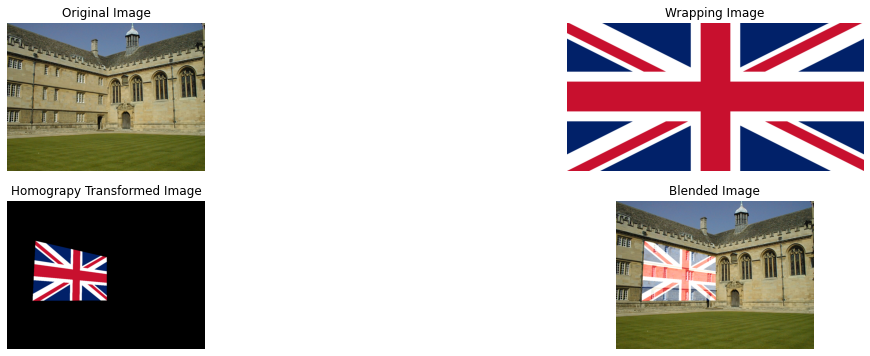

In [3]:
import numpy as np
import cv2 as cv

def MouseHandling(event,x,y,f,pram):  # fuction to identfy the four points by clickig 
    global im_temp,pts_src
    if event== cv.EVENT_LBUTTONDOWN:
        cv.circle(im_temp ,(x,y),3,(0,255,255),5,cv.LINE_AA) # draw circles on the selected points
        cv.imshow("Image",im_temp)
        if len(pts_src)<4:
            pts_src = np.append(pts_src,[(x,y)],axis=0)

architecture_img = cv.imread(r"images\001.jpg")                      # upload the destination image
flag = cv.imread("Flag_of_the_United_Kingdom.svg.png")               # uploading the source image

height , width = architecture_img.shape[0] , architecture_img.shape[1]
f_width,f_height = flag.shape[1] , flag.shape[0]
pts_dst = np.array([[0,0] , [f_width-1,0] , [f_width-1,f_height-1] , [0,f_height-1] ])     # define destination points

cv.namedWindow("Image",1)                                    

ppp = cv.cvtColor(architecture_img, cv.COLOR_BGR2RGB)    # creating a tempary image four mous cllicking part
im_temp = cv.cvtColor(ppp, cv.COLOR_RGB2BGR)
pts_src = np.empty((0,2))

cv.setMouseCallback("Image", MouseHandling)          # open the image in a new window to select 4 points from the user
cv.imshow("Image",im_temp)
cv.waitKey(0)

Homograpy_Matrix , status = cv.findHomography(pts_src, pts_dst) # find homograpy from selected part of the building to the flag 
transformed_flag = cv.warpPerspective(flag, np.linalg.inv(Homograpy_Matrix), (width, height)) # warp the flag                                                                             
blend_image = cv.addWeighted(architecture_img, 1, transformed_flag, 0.8, 0)  # blend the flag in to the building

cv.imshow("Image",blend_image)
cv.waitKey(0)

figure, axes = plt.subplots( 2,2, figsize=(20,6) )

axes[0,0].imshow(cv.cvtColor(architecture_img,cv.COLOR_BGR2RGB))
axes[0,0].set_title("Original Image")
axes[0,0].axis("off")
axes[0,1].imshow(cv.cvtColor(flag,cv.COLOR_BGR2RGB))
axes[0,1].set_title("Wrapping Image")
axes[0,1].axis("off")
axes[1,0].imshow(cv.cvtColor(transformed_flag,cv.COLOR_BGR2RGB))
axes[1,0].set_title("Homograpy Transformed Image")
axes[1,0].axis("off")
axes[1,1].imshow(cv.cvtColor(blend_image,cv.COLOR_BGR2RGB))
axes[1,1].set_title("Blended Image")
axes[1,1].axis("off")



In [99]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

def MouseHandling(event,x,y,f,pram):
    global im_temp,pts_src
    if event== cv.EVENT_LBUTTONDOWN:
        cv.circle(im_temp ,(x,y),3,(0,255,255),3,cv.LINE_AA)
        cv.imshow("Image",im_temp)
        if len(pts_src)<4:
            pts_src = np.append(pts_src,[(x,y)],axis=0)


def Image_wrapping(src1,src2):
    global im_temp,pts_src
    height , width = src1.shape[0] , src1.shape[1]
    wrp_width,wrp_height = src2.shape[1] , src2.shape[0]

    pts_dst = np.array([[0,0] , [wrp_width-1,0] , [wrp_width-1,wrp_height-1] , [0,wrp_height-1] ])

    cv.namedWindow("Image",1)

    new_temp = cv.cvtColor(src1, cv.COLOR_BGR2RGB)
    im_temp = cv.cvtColor(new_temp, cv.COLOR_RGB2BGR)
    
    
    pts_src = np.empty((0,2))

    cv.setMouseCallback("Image", MouseHandling)

    cv.imshow("Image",im_temp)
    cv.waitKey(0)

    Homograpy_Matrix , status = cv.findHomography(pts_src, pts_dst)
    transformed_wrapper = cv.warpPerspective(src2, np.linalg.inv(Homograpy_Matrix), (width, height))
    blend_image = cv.addWeighted(src1, 0.8, transformed_wrapper, 0.5, 0.2)

    cv.imshow("Image",blend_image)
    cv.waitKey(0)

    return(transformed_wrapper,blend_image)    



2 

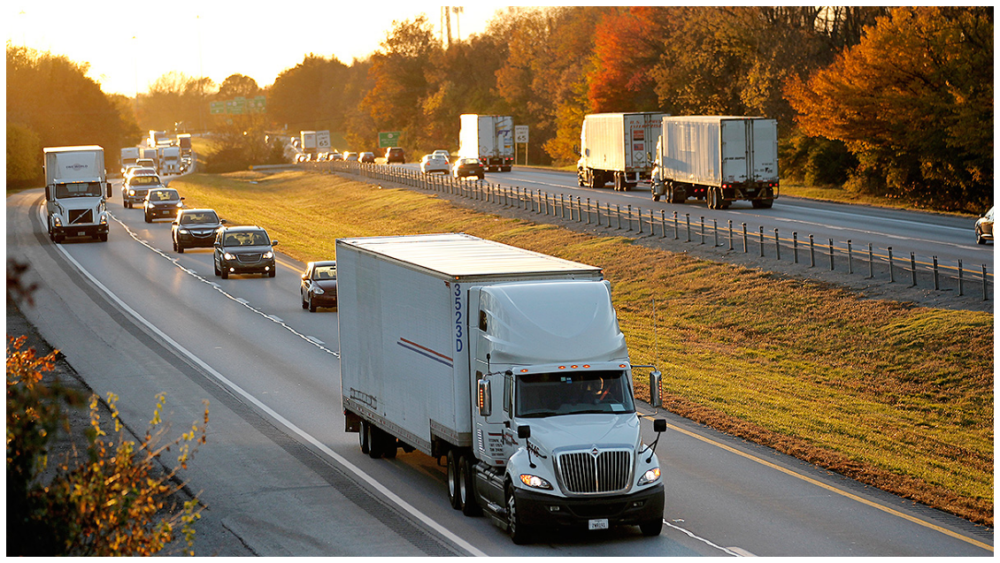

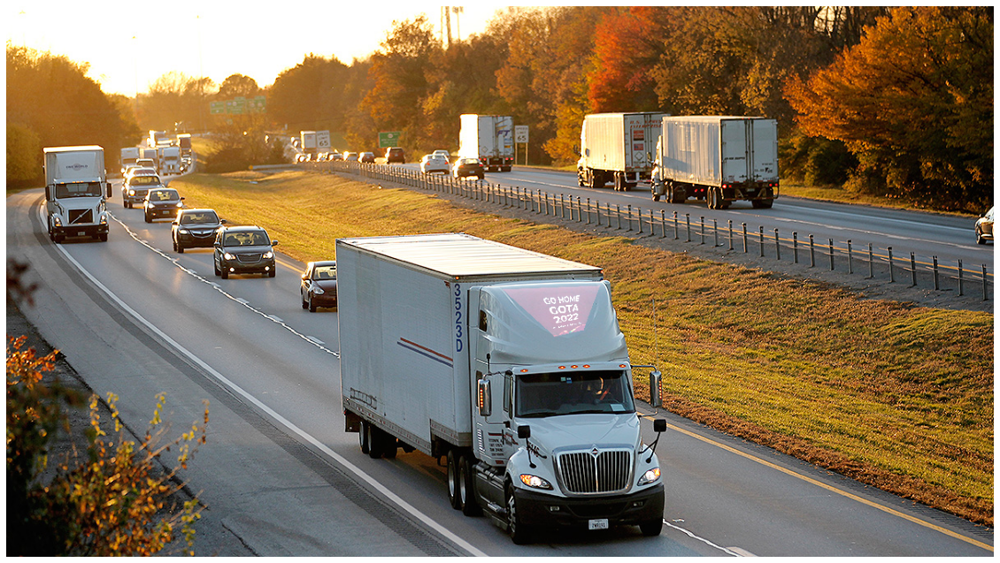

In [123]:
car = cv.imread("tonnage_3.jpg")
sticker = cv.imread("channels4_profile.jpg")

transformed_sticker,belnded_img = Image_wrapping(car,sticker)

plt.figure(figsize=(20,12))
plt.imshow(cv.cvtColor(car,cv.COLOR_BGR2RGB))
plt.axis('off')

plt.figure(figsize=(20,12))
plt.imshow(cv.cvtColor(belnded_img,cv.COLOR_BGR2RGB))
plt.axis('off')

plt.show()

3

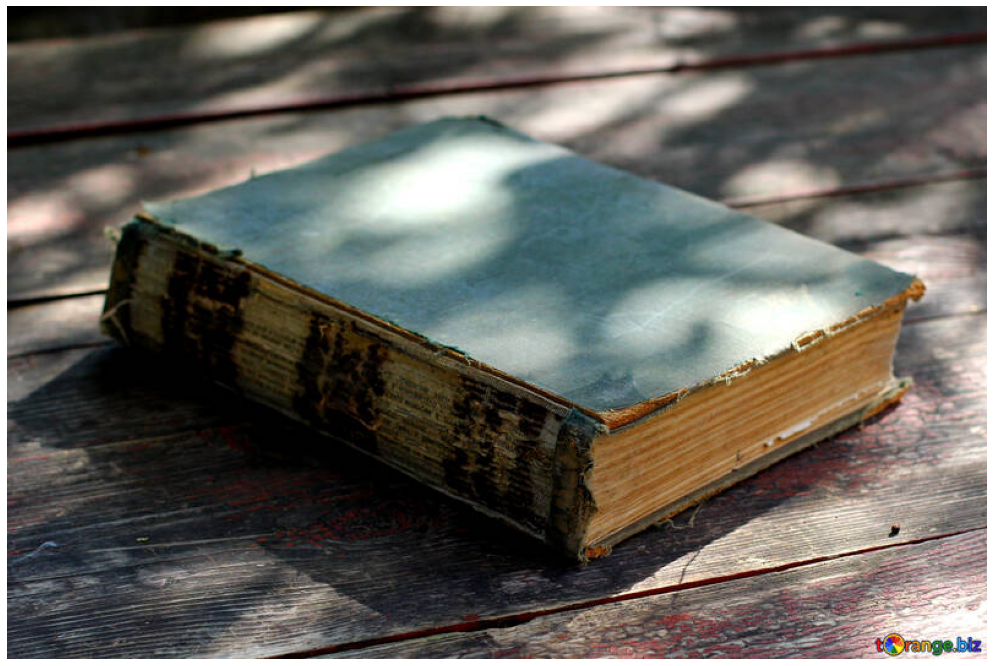

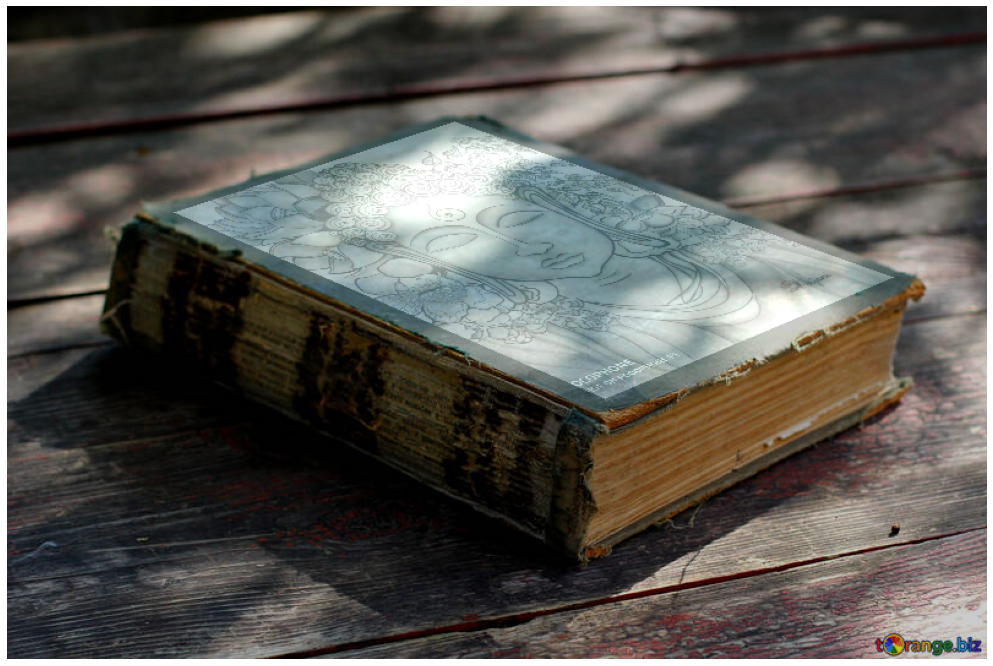

In [102]:
book = cv.imread("book002.jpg")
drawing = cv.imread("WhatsApp Image 2021-05-14 at 01.01.04.jpeg")

transformed_sticker,belnded_img = Image_wrapping(book,drawing)

plt.figure(figsize=(20,12))
plt.imshow(cv.cvtColor(book,cv.COLOR_BGR2RGB))
plt.axis('off')

plt.figure(figsize=(20,12))
plt.imshow(cv.cvtColor(belnded_img,cv.COLOR_BGR2RGB))
plt.axis('off')

plt.show()

### Question 3
## SIFT _ Homography _ RANSAC

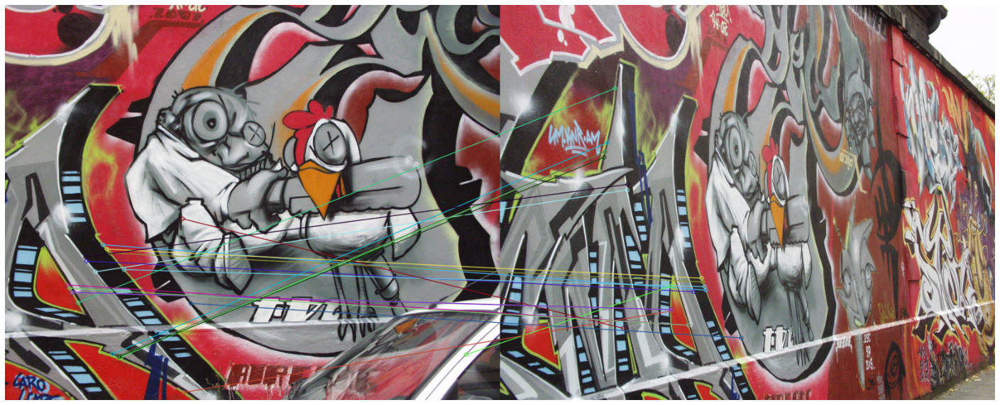

In [15]:
import numpy as np
import cv2 as cv
img1 = cv.imread(r'graf\img1.ppm')
img1 = cv.cvtColor(img1, cv.COLOR_BGR2RGB)
img5 = cv.imread(r'graf\img5.ppm')
img5 = cv.cvtColor(img5, cv.COLOR_BGR2RGB)

sift = cv.SIFT_create(nOctaveLayers=3, contrastThreshold=0.1, edgeThreshold=25, sigma=1)# detect features from the image
keypoints_1, descriptors_1 = sift.detectAndCompute(img1, None) 
keypoints_2, descriptors_2 = sift.detectAndCompute(img5, None) 
# draw the detected key points
bf = cv.BFMatcher(cv.NORM_L1, crossCheck=True)
matches = bf.match(descriptors_1,descriptors_2)
matches = sorted(matches, key = lambda x:x.distance)
matched_img = cv.drawMatches(img1, keypoints_1, img5, keypoints_2, matches[:20], img5, flags=2)


plt.figure(figsize=(25,18))
plt.imshow(matched_img)
plt.axis('off')
plt.show()

In [2]:
def sift_keypoint(src,dst):
    sift = cv.SIFT_create(nOctaveLayers=3, contrastThreshold=0.1, edgeThreshold=25, sigma=1)# detect features from the image
    keypoints_1, descriptors_1 = sift.detectAndCompute(src, None) 
    keypoints_2, descriptors_2 = sift.detectAndCompute(dst, None) 

    # draw the detected key points
    bf = cv.BFMatcher(cv.NORM_L1, crossCheck=True)
    matches = bf.match(descriptors_1,descriptors_2)
    matches = sorted(matches, key = lambda x:x.distance)

        # Initialize lists
    list_kp1 = []
    list_kp2 = []

    # For each match...
    for mat in matches:
        # Get the matching keypoints for each of the images
        img1_idx = mat.queryIdx
        img2_idx = mat.trainIdx
        # x - columns
        # y - rows
        # Get the coordinates
        (x1, y1) = keypoints_1[img1_idx].pt
        (x2, y2) = keypoints_2[img2_idx].pt

        # Append to each list
        list_kp1.append((int(x1+0.5), int(y1+0.5)))
        list_kp2.append((int(x2+0.5), int(y2+0.5)))
    return(list_kp1,list_kp2)


import random as rnd

def Homography_by_ransac(src,dst,N,threshold):
        # Defining RANSAC parametres
    max_inlinears = 0
    H=[]
        # getting the sift matching points in two images
    src_keylist , dst_keylist = sift_keypoint(src,dst)
    src_keylist, dst_keylist = np.array(src_keylist) , np.array(dst_keylist)
   

    for samp in range(0,N):
            # picking four random indexes
        ind1  =rnd.randrange(0,len(src_keylist))
        ind2 = rnd.randrange(0,len(src_keylist))
        ind3 = rnd.randrange(0,len(src_keylist))
        ind4 = rnd.randrange(0,len(src_keylist))
                                                    # getting cordinates of the random indexes 
        s_pt1 ,d_pt1 = src_keylist[ind1]  , dst_keylist[ind1]
        s_pt2 ,d_pt2 = src_keylist[ind2]  , dst_keylist[ind2]
        s_pt3 ,d_pt3 = src_keylist[ind3]  , dst_keylist[ind3]
        s_pt4 ,d_pt4 = src_keylist[ind4]  , dst_keylist[ind4]
                                                    # make sure the 4 points are not co-linear.
        colinearity =  bool(np.cross(s_pt1,s_pt2)) and bool(np.cross(s_pt1,s_pt3)) and bool(np.cross(s_pt1,s_pt4))
        colinearity =  colinearity and bool(np.cross(s_pt2,s_pt3)) and bool(np.cross(s_pt2,s_pt4))
        colinearity =  colinearity and bool(np.cross(s_pt3,s_pt4))
        if (not colinearity): continue        
        
                                                    
        A = np.array([[ -s_pt1[0], -s_pt1[1], -1, 0, 0, 0, d_pt1[0]*s_pt1[0], d_pt1[0]*s_pt1[1], d_pt1[0]], # Matrix from
                      [ 0, 0, 0, -s_pt1[0], -s_pt1[1], -1, d_pt1[1]*s_pt1[0], d_pt1[1]*s_pt1[1], d_pt1[1]], # the selected points

                      [ -s_pt2[0], -s_pt2[1], -1, 0, 0, 0, d_pt2[0]*s_pt2[0], d_pt2[0]*s_pt2[1], d_pt2[0]],
                      [ 0, 0, 0, -s_pt2[0], -s_pt2[1], -1, d_pt2[1]*s_pt2[0], d_pt2[1]*s_pt2[1], d_pt2[1]],

                      [ -s_pt3[0], -s_pt3[1], -1, 0, 0, 0, d_pt3[0]*s_pt3[0], d_pt3[0]*s_pt3[1], d_pt3[0]],
                      [ 0, 0, 0, -s_pt3[0], -s_pt3[1], -1, d_pt3[1]*s_pt3[0], d_pt3[1]*s_pt3[1], d_pt3[1]],

                      [ -s_pt4[0], -s_pt4[1], -1, 0, 0, 0, d_pt4[0]*s_pt4[0], d_pt4[0]*s_pt4[1], d_pt4[0]],
                      [ 0, 0, 0, -s_pt4[0], -s_pt4[1], -1, d_pt4[1]*s_pt4[0], d_pt4[1]*s_pt4[1], d_pt4[1]],
                      [0, 0, 0, 0, 0, 0, 0, 0, 1]])
 
        h = np.linalg.inv(A) @ np.array([[0,0,0,0,0,0,0,0,1]]).T  # solving for the H vector
        h = np.reshape(h,(3,3))                                   # 3X3 Homography matrix

        X = np.vstack([src_keylist.T , np.ones( (1, len(src_keylist)) )]) # add "1"s as Z vlues of the original cordinates
        transformed_img = h @ X                 # trnsforme the source image sift points by the Homography
        z= np.array([transformed_img[-1]]).T   
        transformed_img = (transformed_img[:2].T) / z  # finding the actual (x,y) cordinates of the transformed model.

        #RANSAC proceedure 
        inlinears_count = 0
        for  i in range(0 , len(transformed_img)):
                                            # finding the error between transformed and destination model
            distance = np.sqrt( (transformed_img[i][0] - dst_keylist[i][0])**2 + (transformed_img[i][1] - dst_keylist[i][1])**2 )
            if abs(distance) < threshold:
                inlinears_count += 1
        if inlinears_count > max_inlinears:
            max_inlinears = inlinears_count
            H = h
   
   
    return(H)



In [3]:
import numpy as np
import cv2 as cv
img1 = cv.imread(r'graf\img1.ppm')
img1 = cv.cvtColor(img1, cv.COLOR_BGR2RGB)
img2 = cv.imread(r'graf\img2.ppm')
img2 = cv.cvtColor(img2, cv.COLOR_BGR2RGB)
img4 = cv.imread(r'graf\img4.ppm')
img4 = cv.cvtColor(img4, cv.COLOR_BGR2RGB)
img5 = cv.imread(r'graf\img5.ppm')
img5 = cv.cvtColor(img5, cv.COLOR_BGR2RGB)

In [4]:
s = 4
t = 0.5
e = 0.85
p = 0.99

N = int( (np.log(1-p) / np.log(1 - (1-e)**s)) + 0.5 )  # adding 0.5 to get the ceil value
#N=10000

In [5]:
H1=Homography_by_ransac(img1,img2,N,t)
print(H1)

[[ 8.74302325e-01  3.11794715e-01 -3.85505141e+01]
 [-1.87441614e-01  9.34750930e-01  1.54583565e+02]
 [ 1.86000267e-04 -1.58942814e-05  1.00000000e+00]]


In [6]:
H2=Homography_by_ransac(img2,img4,N,t)
print(H2)

[[ 8.59825549e-01  4.36410259e-01 -6.64467379e+01]
 [ 5.82839308e-02  1.01619617e+00 -9.92363845e+00]
 [ 2.62649219e-04 -6.23932634e-05  1.00000000e+00]]


In [7]:
H3=Homography_by_ransac(img4,img5,N,t)
print(H3)

[[ 6.36906164e-01 -3.91633525e-01  2.99598915e+02]
 [ 5.68147217e-01  7.68953032e-01 -1.19790769e+02]
 [ 5.49654434e-05 -8.03714792e-05  1.00000000e+00]]


In [21]:
H = H3 @ H2 @ H1
print("Computed homography matrix is")
print(H)

Computed homography matrix is
[[ 6.02212282e-01  5.43485858e-02  2.16456716e+02]
 [ 2.13712560e-01  1.12827784e+00 -2.42438124e+01]
 [ 4.74836493e-04 -3.29251239e-05  9.66816466e-01]]


In [9]:
G= np.array([[6.2544644e-01  , 5.7759174e-02 ,  2.2201217e+02],
               [2.2240536e-01 ,  1.1652147e+00 , -2.5605611e+01],
                [4.9212545e-04 , -3.6542424e-05 ,  1.0000000e+00]])

print("Given homography matrix is")
print(G)


Given homography matrix is
[[ 6.2544644e-01  5.7759174e-02  2.2201217e+02]
 [ 2.2240536e-01  1.1652147e+00 -2.5605611e+01]
 [ 4.9212545e-04 -3.6542424e-05  1.0000000e+00]]


In [23]:
H-G

array([[-2.32341578e-02, -3.41058821e-03, -5.55545366e+00],
       [-8.69280001e-03, -3.69368611e-02,  1.36179861e+00],
       [-1.72889571e-05,  3.61730013e-06, -3.31835338e-02]])

In [22]:
np.abs(H-G)

array([[2.32341578e-02, 3.41058821e-03, 5.55545366e+00],
       [8.69280001e-03, 3.69368611e-02, 1.36179861e+00],
       [1.72889571e-05, 3.61730013e-06, 3.31835338e-02]])

In [36]:
print("The percentage erroe of the computed matrix is")
print(np.linalg.norm(H-G)/np.linalg.norm(G)*100)

The percentage erroe of the computed matrix is
2.559484902054964


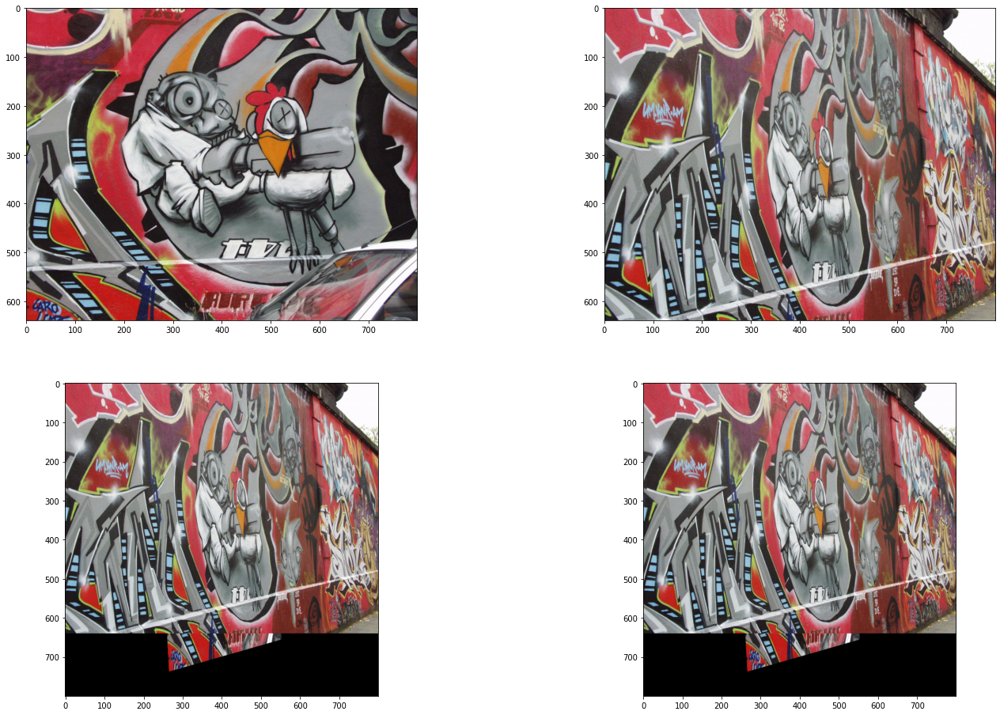

In [13]:
warp= cv.warpPerspective(img1, H , (800,800)) # warp the image using the Homograpy
result = warp                                 # create a temp result to uotput
result[0:img5.shape[0],0:img5.shape[1]] = img5 # stitch the warped image 1 in to image 5 

figure,ax = plt.subplots(2,2,figsize=(24,16))
ax[0,0].imshow(img1)
ax[0,1].imshow(img5)
ax[1,0].imshow(warp)
ax[1,1].imshow(result)
plt.show()